In [2]:
import numpy as np
import loompy
import numpy as np
import pandas as pd
import scanpy as sc
import scipy as sp
import matplotlib.pyplot as plt
import glob
import bbknn
import seaborn as sns
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.1 (python 3.7.6) on 2020-09-28 10:58.
 Your version: 		 0.2.1 
 Latest version: 	 0.2.2


In [3]:
sc.settings.set_figure_params(dpi=140)

In [4]:
adata1 = sc.read_10x_h5(r'D:\Paper Writing Driskell Lab\ExpDerm2020\tdTomatopythonneg\LWC14dpwneg\GSM4797746_D14_LWCneg_aligned_to_tdT_filtered_feature_bc_matrix.h5')

adata2 = sc.read_10x_h5(r'D:\Paper Writing Driskell Lab\ExpDerm2020\tdTomatopythonneg\LWC14dpwpos\GSM4797739_D14_LWCpos_aligned_to_tdT_filtered_gene_bc_matrices_h5.h5')

adata3 = sc.read_10x_h5(r'D:\Paper Writing Driskell Lab\ExpDerm2020\tdTomatopythonneg\LWP14dpwneg\GSM4797747_D14_LWPneg_aligned_to_tdT_filtered_feature_bc_matrix.h5')

adata4 = sc.read_10x_h5(r'D:\Paper Writing Driskell Lab\ExpDerm2020\tdTomatopythonneg\LWP14dpwpos\GSM4797740_D14_LWPpos_aligned_to_tdT_filtered_gene_bc_matrices_h5.h5')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [5]:
adata1.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

adata2.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

adata3.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

adata4.var_names_make_unique()  # this is unnecessary if using 'gene_ids'


In [6]:
adataLWC = adata1.concatenate(adata2, batch_key='batch', batch_categories=['LWC14dpwNeg','LWC14dpwPos'])

adataLWP = adata3.concatenate(adata4, batch_key='batch', batch_categories=['LWP14dpwNeg','LWP14dpwPos'])

adata = adataLWC.concatenate(adataLWP, batch_key='Time', batch_categories=['Center','Periphery'])

In [7]:
adata

AnnData object with n_obs × n_vars = 24014 × 28001
    obs: 'batch', 'Time'
    var: 'gene_ids', 'feature_types-LWC14dpwNeg-Center', 'genome-LWC14dpwNeg-Center', 'feature_types-LWP14dpwNeg-Periphery', 'genome-LWP14dpwNeg-Periphery'

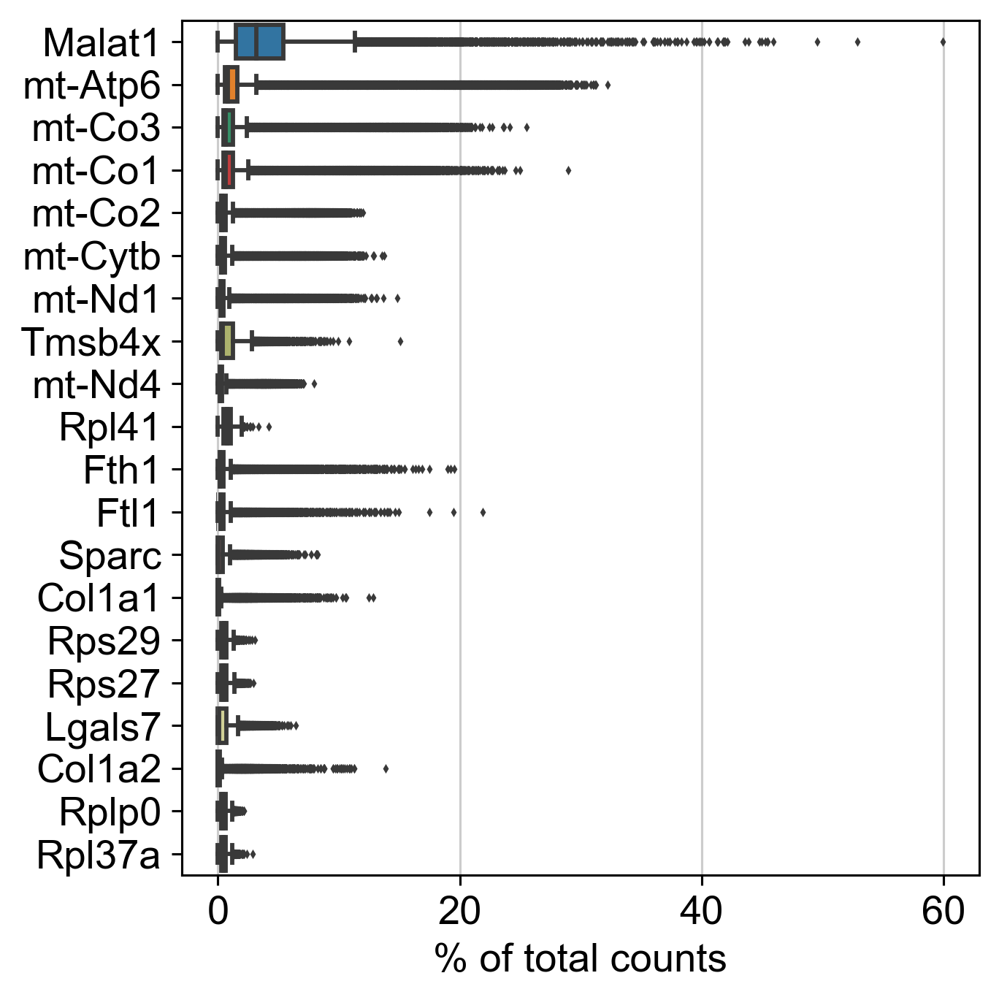

In [8]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [9]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [10]:
mito_genes = adata.var_names.str.startswith('mt-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

... storing 'batch' as categorical
... storing 'feature_types-LWC14dpwNeg-Center' as categorical
... storing 'genome-LWC14dpwNeg-Center' as categorical
... storing 'feature_types-LWP14dpwNeg-Periphery' as categorical
... storing 'genome-LWP14dpwNeg-Periphery' as categorical


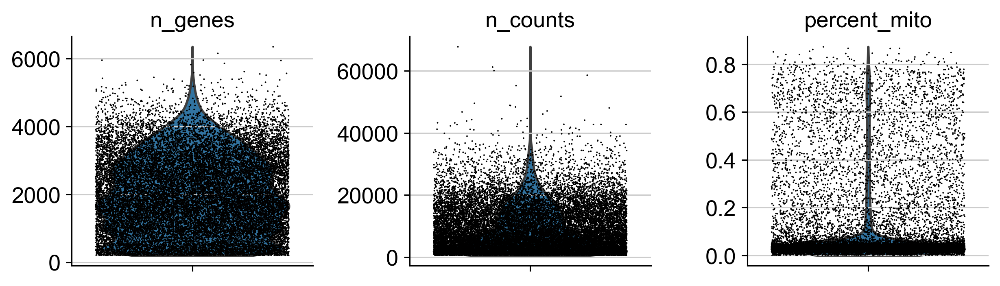

In [11]:
sc.pl.violin(adata, ['n_genes', 'n_counts','percent_mito'],
             jitter=0.4, multi_panel=True)

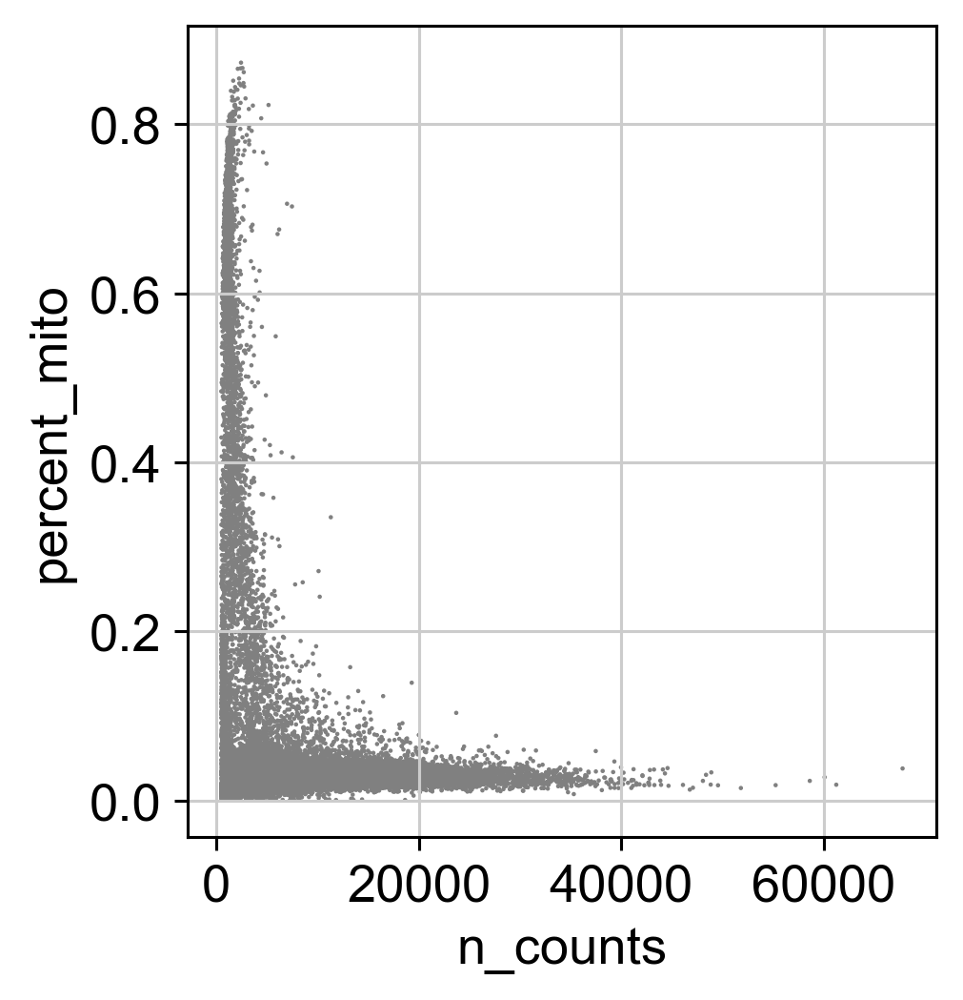

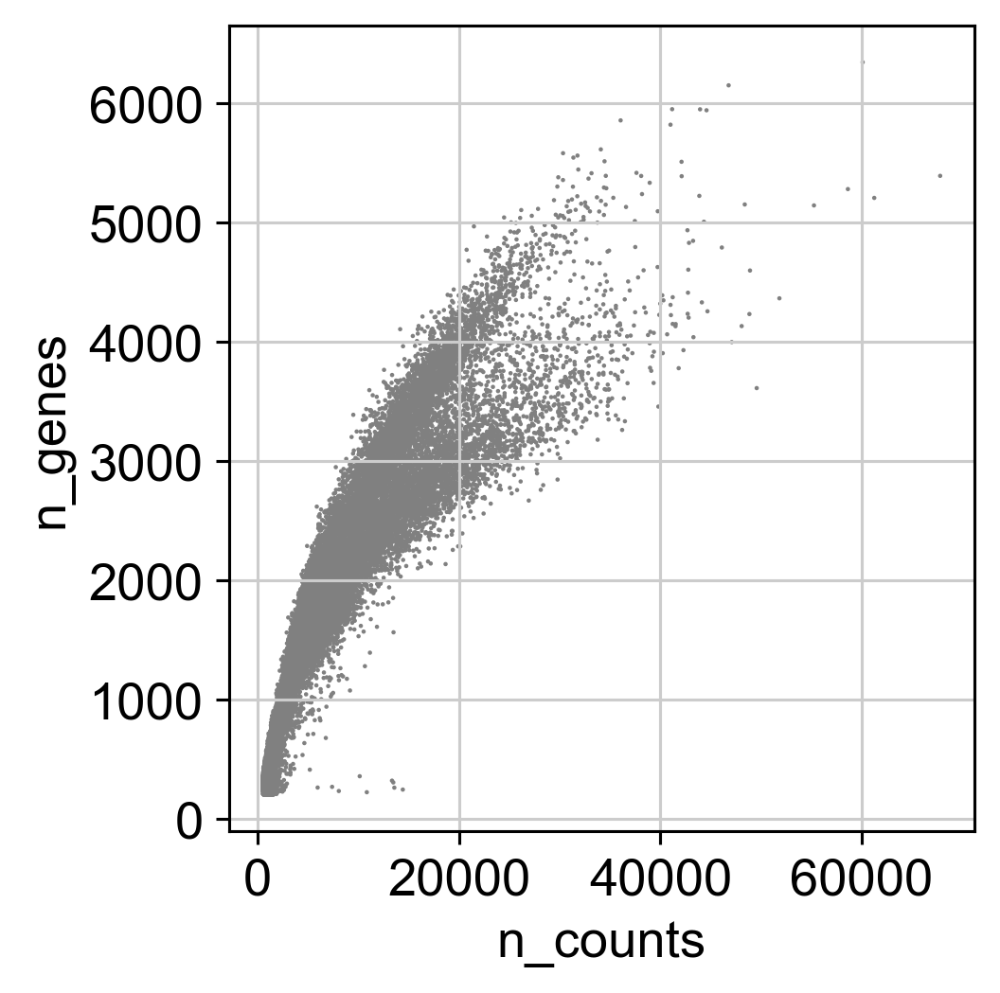

In [12]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

In [13]:
adata

AnnData object with n_obs × n_vars = 22070 × 19672
    obs: 'batch', 'Time', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types-LWC14dpwNeg-Center', 'genome-LWC14dpwNeg-Center', 'feature_types-LWP14dpwNeg-Periphery', 'genome-LWP14dpwNeg-Periphery', 'n_cells'

In [14]:
adata = adata[adata.obs.n_genes < 6000, :]
adata = adata[adata.obs.percent_mito < 0.05, :]

In [15]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

Trying to set attribute `.obs` of view, copying.


In [16]:
sc.pp.log1p(adata)

In [17]:
adata.raw = adata

In [18]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

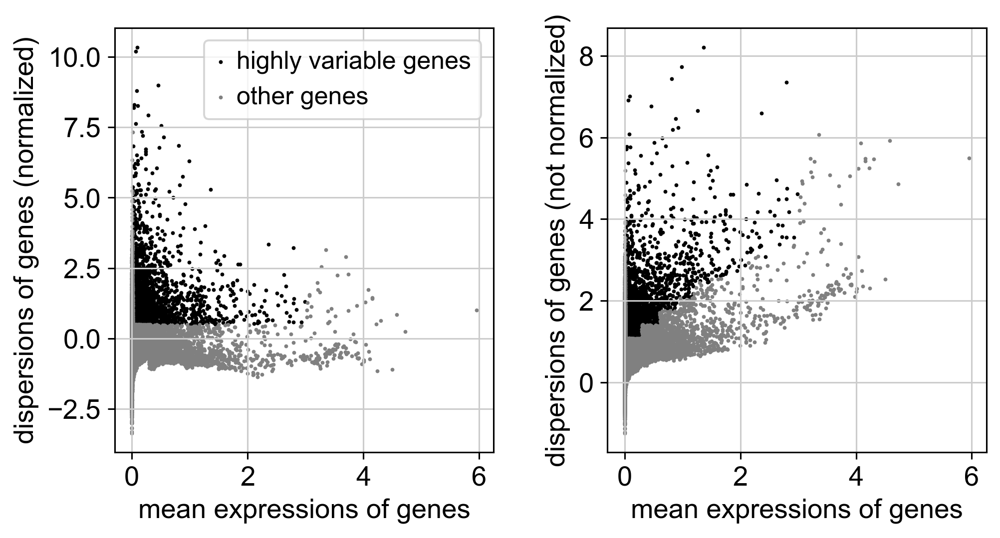

In [19]:
sc.pl.highly_variable_genes(adata)

In [20]:
adata = adata[:, adata.var['highly_variable']]

In [21]:
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])

In [22]:
sc.pp.scale(adata, max_value=10)

In [23]:
sc.tl.pca(adata, svd_solver='arpack')

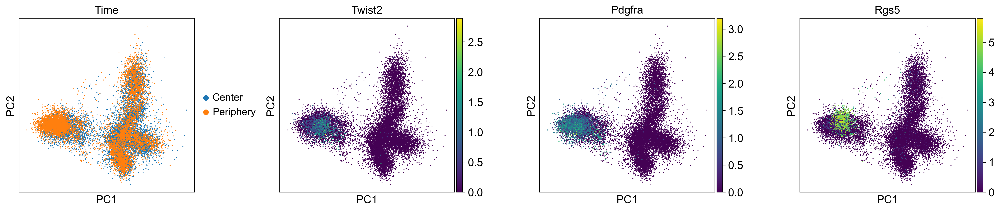

In [24]:
sc.pl.pca(adata, color=['Time', 'Twist2', 'Pdgfra', 'Rgs5'], wspace=0.35)

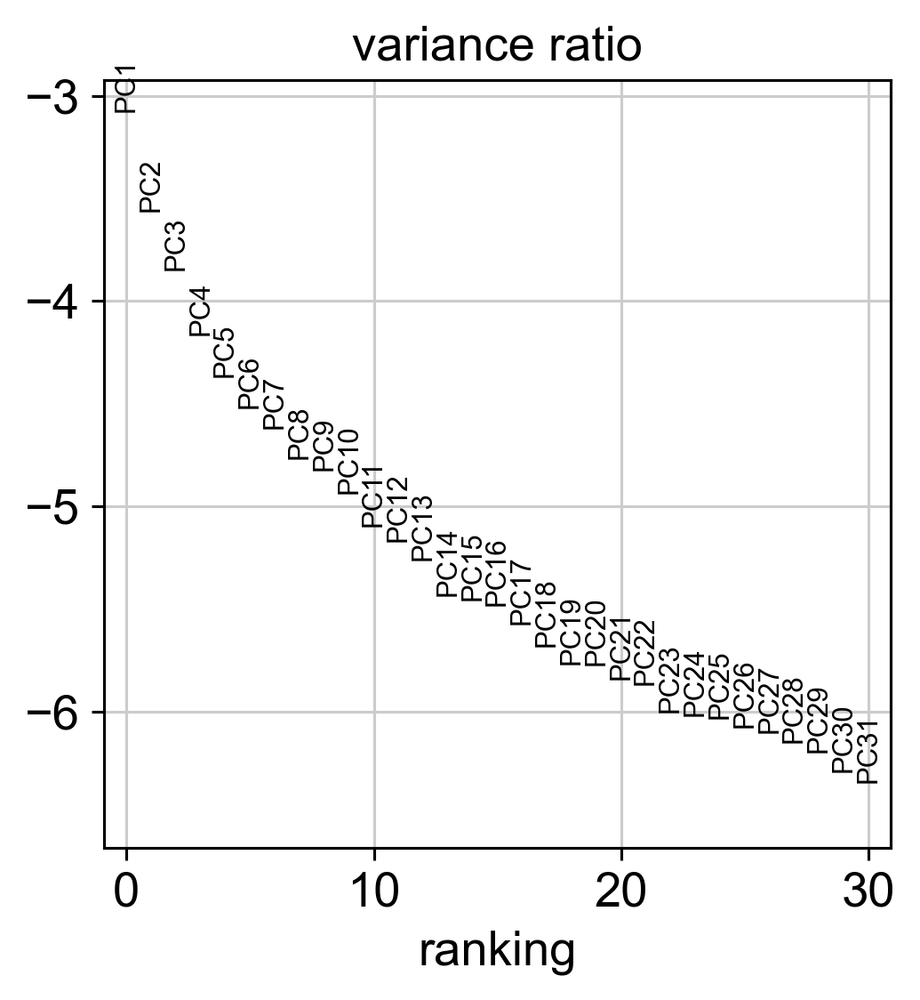

In [25]:
sc.pl.pca_variance_ratio(adata, log=True)

In [26]:
adata

AnnData object with n_obs × n_vars = 17291 × 2856
    obs: 'batch', 'Time', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types-LWC14dpwNeg-Center', 'genome-LWC14dpwNeg-Center', 'feature_types-LWP14dpwNeg-Periphery', 'genome-LWP14dpwNeg-Periphery', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'Time_colors'
    obsm: 'X_pca'
    varm: 'PCs'

In [27]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

In [28]:
sc.tl.umap(adata)

In [31]:
sc.tl.leiden(adata, resolution=0.1)

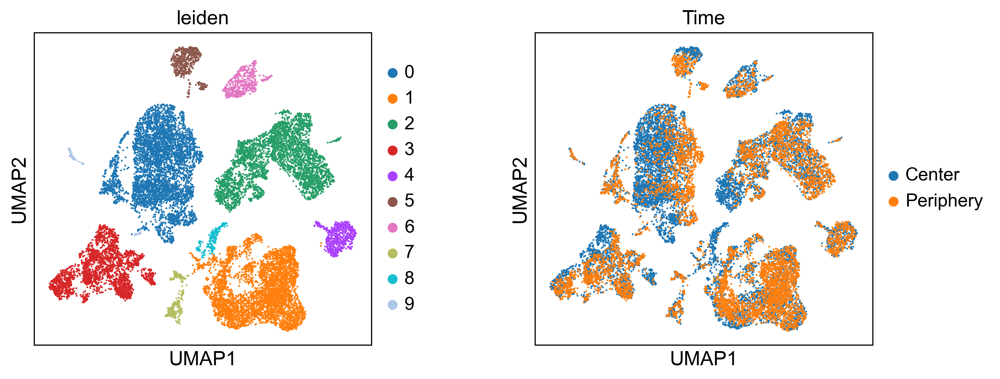

In [32]:
sc.pl.umap(adata, color=['leiden','Time'], legend_loc='right margin', wspace=0.35)

In [34]:
#new_cluster_names = [
#    '0 Epidermis',
#'1 Fibroblasts 1', 
#'2 Blood',
#'3 Blood',
#'4 Pericyte',
#'5 Blood',
#'6 Schwann',
#'7 Blood Vessels',
#'8 Fibroblast 2',
#'9 Blood'
#]
#adata.rename_categories('leiden', new_cluster_names)

In [36]:
#####SUBSETTING THE SUBSET DATA#####

In [37]:
adata_subset = adata[adata.obs['leiden'].isin(
    ['1','8'])]

In [38]:
adata_subset

View of AnnData object with n_obs × n_vars = 4722 × 2856
    obs: 'batch', 'Time', 'n_genes', 'percent_mito', 'n_counts', 'leiden'
    var: 'gene_ids', 'feature_types-LWC14dpwNeg-Center', 'genome-LWC14dpwNeg-Center', 'feature_types-LWP14dpwNeg-Periphery', 'genome-LWP14dpwNeg-Periphery', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'pca', 'Time_colors', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [39]:
#bdata = bbknn.bbknn(adata_subset, batch_key='Time', copy=True)

In [40]:
sc.tl.pca(adata_subset, svd_solver='arpack')

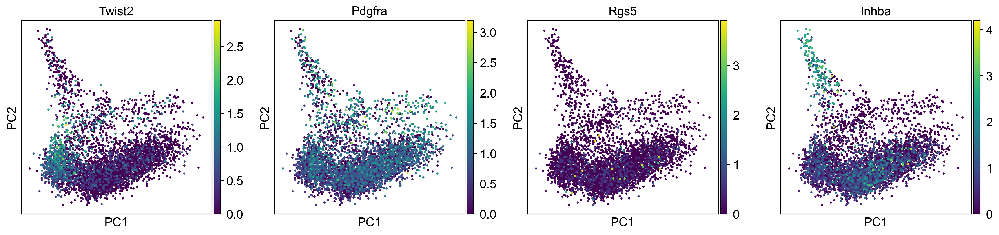

In [41]:
sc.pl.pca(adata_subset, color=['Twist2', 'Pdgfra', 'Rgs5','Inhba'])

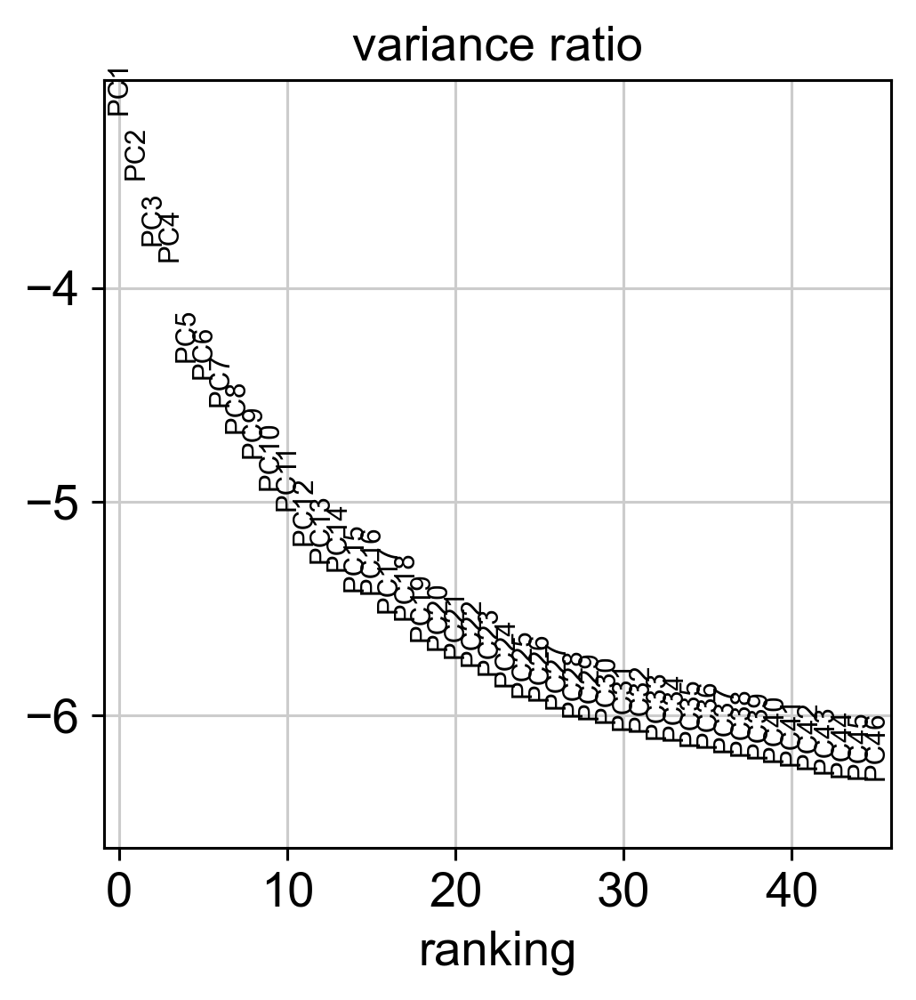

In [42]:
sc.pl.pca_variance_ratio(adata_subset, n_pcs=45, log=True)

In [43]:
##sc.pp.combat(adata_subset, key='Time')

In [44]:
sc.pp.neighbors(adata_subset)

In [45]:
sc.tl.umap(adata_subset)

In [46]:
#sc.tl.umap(adata_subset)

In [47]:
sc.tl.leiden(adata_subset, resolution=0.5)

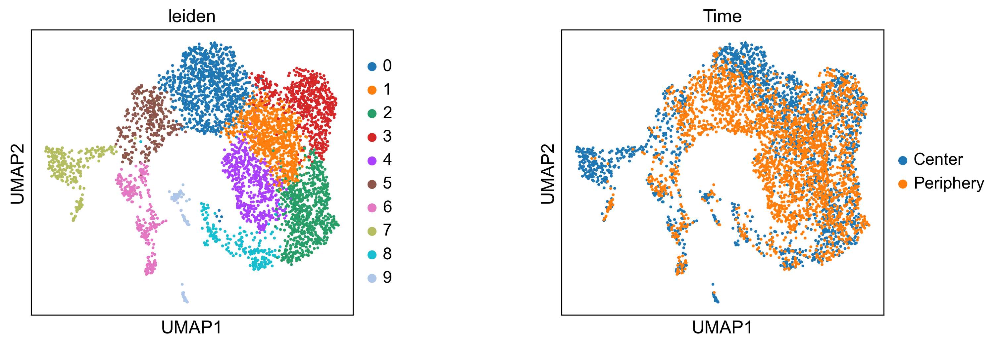

In [48]:
sc.pl.umap(adata_subset, color=['leiden','Time'], legend_loc='right margin', wspace=0.5, size=20)

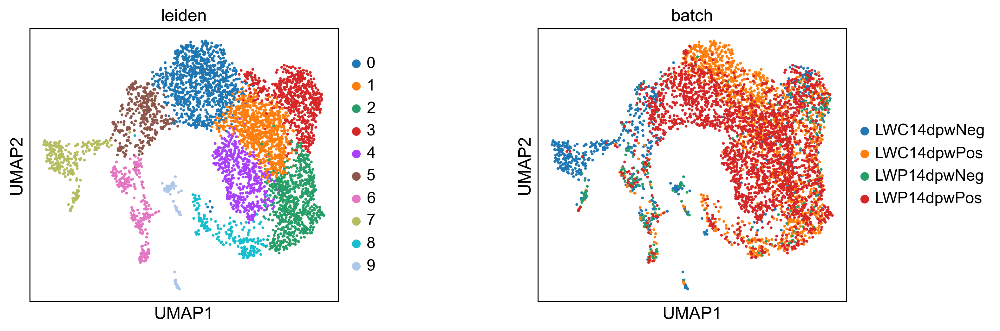

In [49]:
sc.pl.umap(adata_subset, color=['leiden','batch'], legend_loc='right margin', wspace=0.5, size=20)

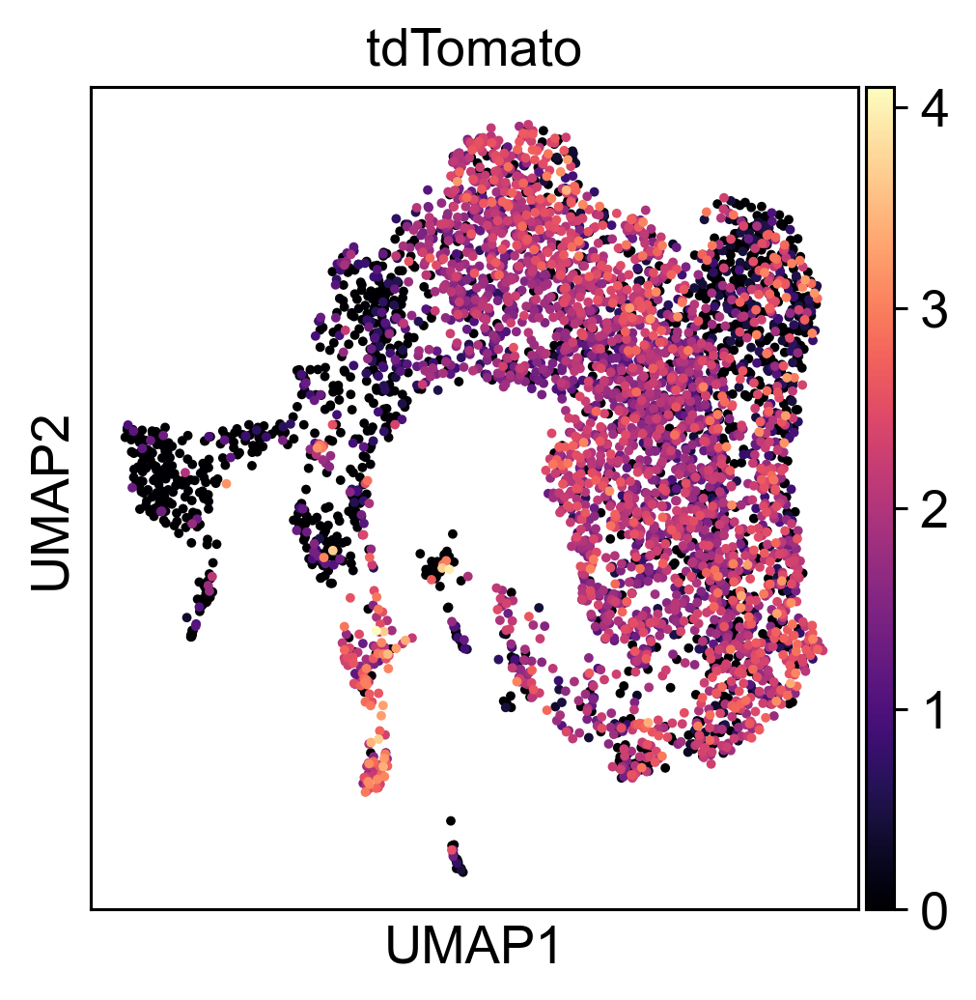

In [50]:
sc.pl.umap(adata_subset, color=['tdTomato'], 
           color_map= 'magma',
           wspace=0.35, use_raw=True)

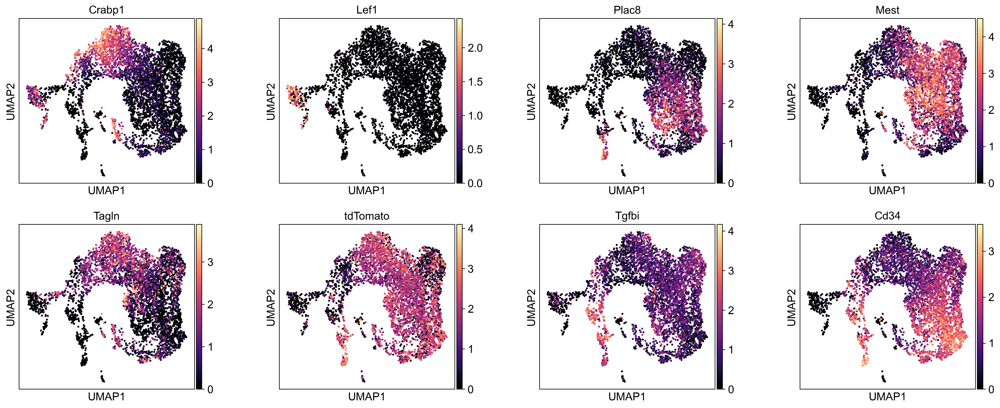

In [57]:
sc.pl.umap(adata_subset, color=['Crabp1','Lef1','Plac8','Mest','Tagln','tdTomato',
                               'Tgfbi','Cd34'], 
           color_map= 'magma',
           wspace=0.35)

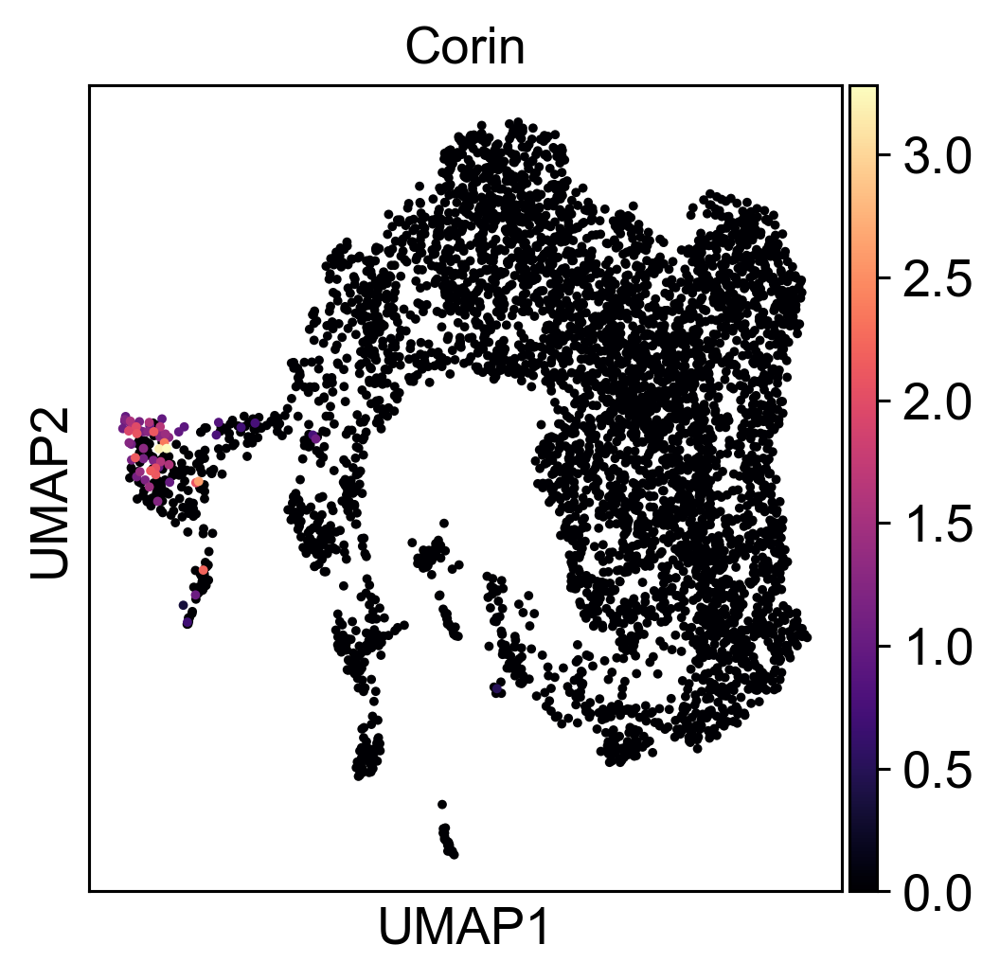

In [59]:
sc.pl.umap(adata_subset, color=['Corin'], 
           color_map= 'magma',
           wspace=0.35)

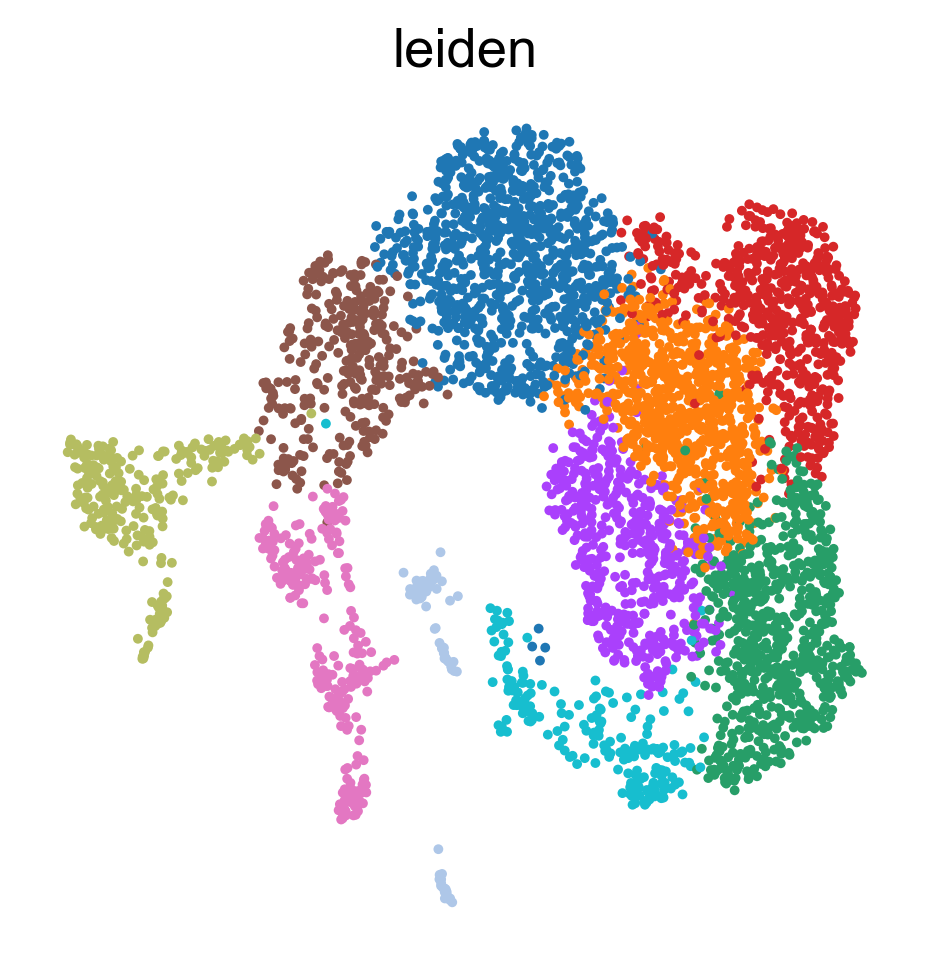

In [60]:
sc.pl.umap(adata_subset, color='leiden', legend_loc='none', legend_fontsize='12.0',
           frameon=False)

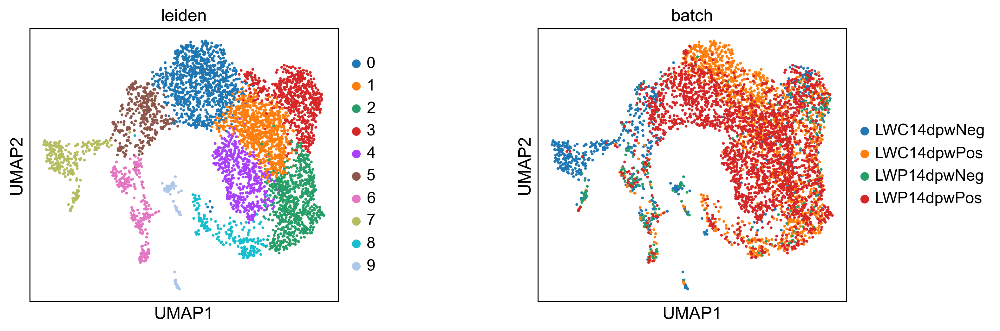

In [61]:
sc.pl.umap(adata_subset, color=['leiden','batch'], legend_loc='right margin', wspace=0.5, size=20)

In [62]:

###COLORING THE PLOT####

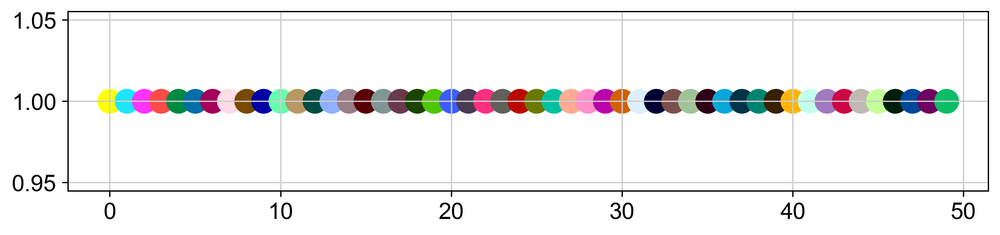

In [63]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
from matplotlib import rcParams
import scanpy as sc
pl.figure(figsize=(10, 2))
for i in range(50):
    pl.scatter(i, 1, c=sc.pl.palettes.godsnot_102[i], s=200)
pl.show()

In [64]:
default_colors = np.array(sc.pl.palettes.godsnot_102)
new_colors = np.array(adata_subset.uns['leiden_colors'])

In [65]:
new_colors[[0]] = default_colors[[4]]  # '0 Upper Wound Crapb1'
new_colors[[1]] = default_colors[[40]]  #  '1 Lower Wound Mest'
new_colors[[2]] = default_colors[[30]]  # '2 Lower Wound Plac8'
new_colors[[3]] = default_colors[[8]]  # '3 Lower Wound Gpx3/Fmod'
new_colors[[4]] = default_colors[[11]]  # '4 Lower Wound Mest'
new_colors[[5]] = default_colors[[19]]  # '5 Upper Dpp4'
new_colors[[6]] = default_colors[[12]]  # '6 CD34 Tgfbi
new_colors[[7]] = default_colors[[20]]  # '7 Regenerating DP'
new_colors[[8]] = default_colors[[30]]  #  '8 Lower wound Mest'


In [66]:

adata_subset.uns['leiden_colors'] = new_colors

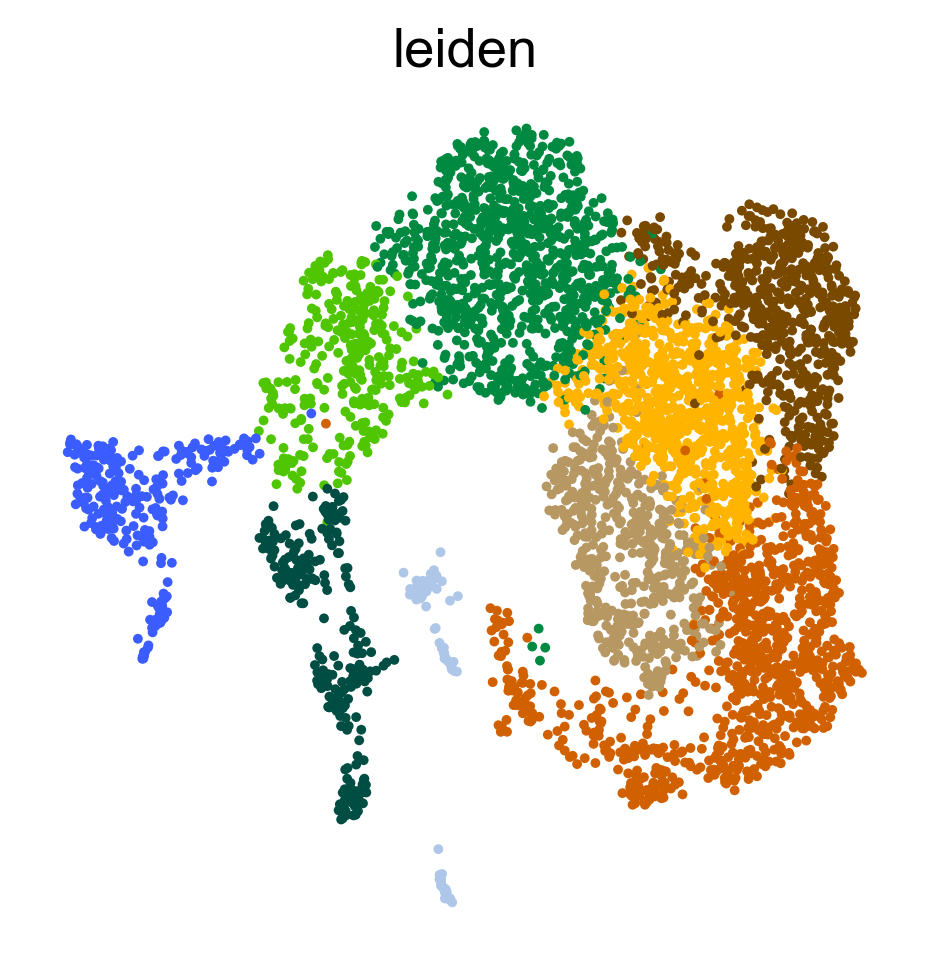

In [67]:
sc.pl.umap(adata_subset, color='leiden', legend_loc='none', legend_fontsize='10.0',
           frameon=False)

In [71]:
###COLORING THE TIME PLOT####

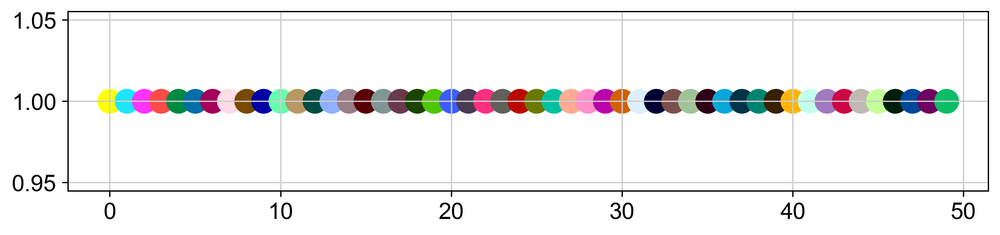

In [72]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
from matplotlib import rcParams
import scanpy as sc
pl.figure(figsize=(10, 2))
for i in range(50):
    pl.scatter(i, 1, c=sc.pl.palettes.godsnot_102[i], s=200)
pl.show()

In [73]:
default_colors = np.array(sc.pl.palettes.godsnot_102)
new_colors = np.array(adata_subset.uns['batch_colors'])

In [74]:
new_colors[[0]] = default_colors[[39]]  # 'LWC14dpwPNeg'
new_colors[[1]] = default_colors[[24]]  #  'LWC14dpwPos'
new_colors[[2]] = default_colors[[16]]  #  'LWP14dpwNeg'
new_colors[[3]] = default_colors[[16]]  #  'LWP14dpwPos'

In [75]:
adata_subset.uns['batch_colors'] = new_colors

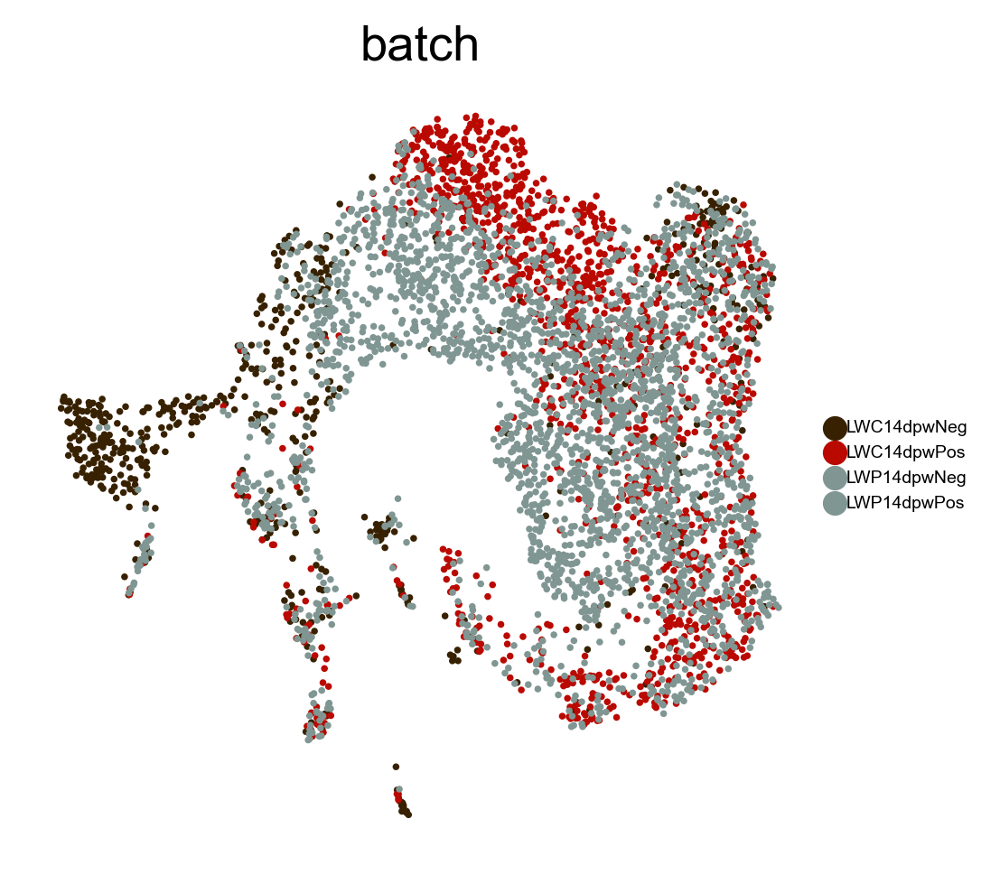

In [76]:
sc.pl.umap(adata_subset, color='batch', legend_loc='right margin', legend_fontsize='5.0',
           frameon=False, size=15)

In [77]:
adata_subset.obs.groupby(["leiden","Time"]).apply(len)

leiden  Time     
0       Center       454
        Periphery    508
1       Center       300
        Periphery    551
2       Center       289
        Periphery    408
3       Center       308
        Periphery    287
4       Center        70
        Periphery    449
5       Center       136
        Periphery    180
6       Center       122
        Periphery    135
7       Center       217
        Periphery     30
8       Center       125
        Periphery     83
9       Center        54
        Periphery     16
dtype: int64

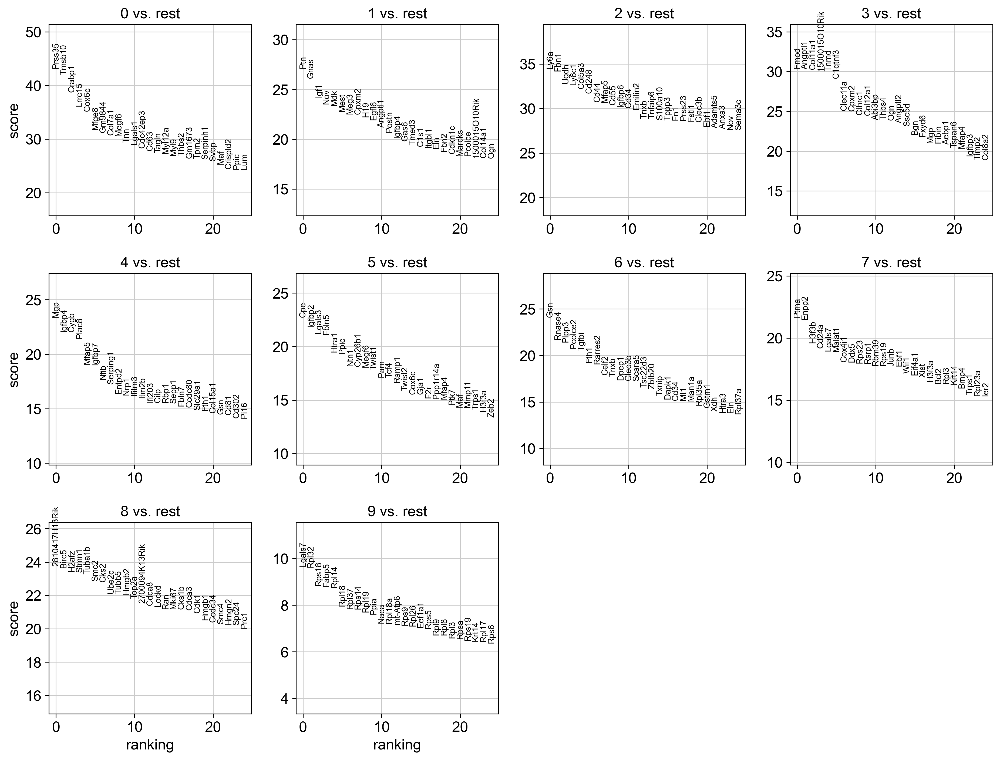

In [78]:
sc.tl.rank_genes_groups(adata_subset,'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_subset,n_genes=25, sharey=False)

In [79]:
rank_cluster=pd.DataFrame(adata_subset.uns['rank_genes_groups']['names'])

In [80]:
rank_cluster.head(25)

,0,1,2,3,4,5,6,7,8,9
0,Prss35,Ptn,Ly6a,Fmod,Mgp,Cpe,Gsn,Ptma,2810417H13Rik,Lgals7
1,Tmsb10,Gnas,Fbn1,Angptl1,Igfbp4,Igfbp2,Rnase4,Enpp2,Birc5,Rpl32
2,Crabp1,Igf1,Ugdh,Col11a1,Cygb,Lgals3,Plpp3,H3f3b,H2afz,Rps18
3,Lrrc15,Nov,Ly6c1,1500015O10Rik,Plac8,Fbln5,Pcolce2,Cd24a,Stmn1,Fabp5
4,Cox6c,Mdk,Col5a3,Tnmd,Mfap5,Htra1,Tgfbi,Lgals7,Tuba1b,Rpl14
5,Mfge8,Mest,Cd248,C1qtnf3,Igfbp7,Ppic,Fth1,Malat1,Smc2,Rpl18
6,Gm9844,Meg3,Cd44,Clec11a,Nfib,Ntn1,Rarres2,Cox4i1,Cks2,Rpl37
7,Col7a1,Cpxm2,Mfap5,Cpxm2,Serping1,Cyp26b1,Celf2,Ddx5,Ube2c,Rps14
8,Megf6,H19,Cd55,Cthrc1,Entpd2,Megf6,Tnxb,Rps23,Tubb5,Rpl19
9,Tnn,Egfl6,Igfbp6,Col12a1,Nrp1,Twist1,Dpep1,Rsrp1,Hmgb2,Ppia
